In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

Text(0.5, 1.0, 'Grayscale')

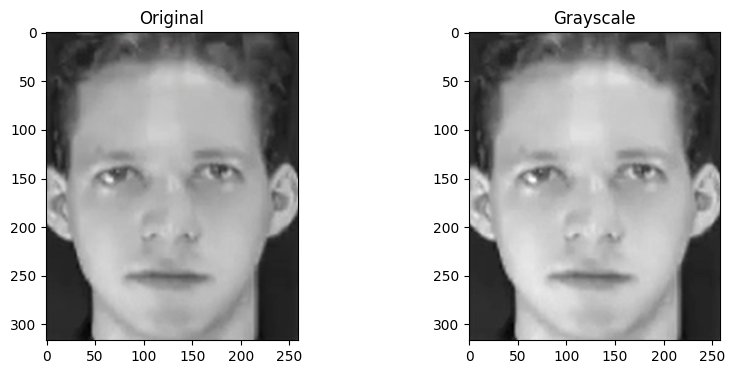

In [2]:
img = cv2.imread("../../images/face2.png")
gray_scale_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(10, 4))
plt.subplot(121); plt.imshow(img[..., ::-1]); plt.title("Original")
plt.subplot(122); plt.imshow(gray_scale_img, cmap="gray"); plt.title("Grayscale")

(317, 259)


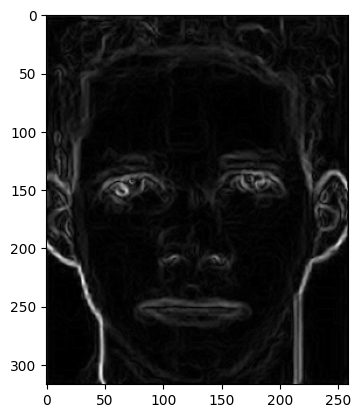

In [3]:
# Roberts cross approximation using Sobel
gx = cv2.Sobel(gray_scale_img, cv2.CV_64F, 1, 0, ksize=1)
gy = cv2.Sobel(gray_scale_img, cv2.CV_64F, 0, 1, ksize=1)
edges = np.hypot(gx, gy).astype(np.uint8)

print(edges.shape)
plt.imshow(edges, cmap="gray")

In [4]:
x_projection = np.sum(edges, axis=1)
y_projection = np.sum(edges, axis=0)

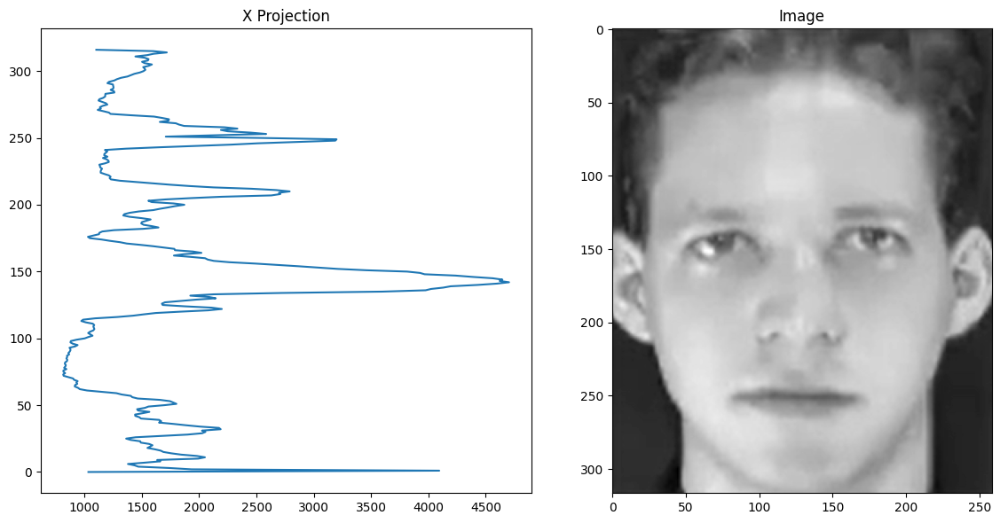

In [5]:
fig = plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(x_projection, range(len(x_projection)))
plt.title('X Projection')

plt.subplot(1, 2, 2)
plt.imshow(gray_scale_img, cmap='gray')
plt.title('Image')

plt.tight_layout()
plt.show()

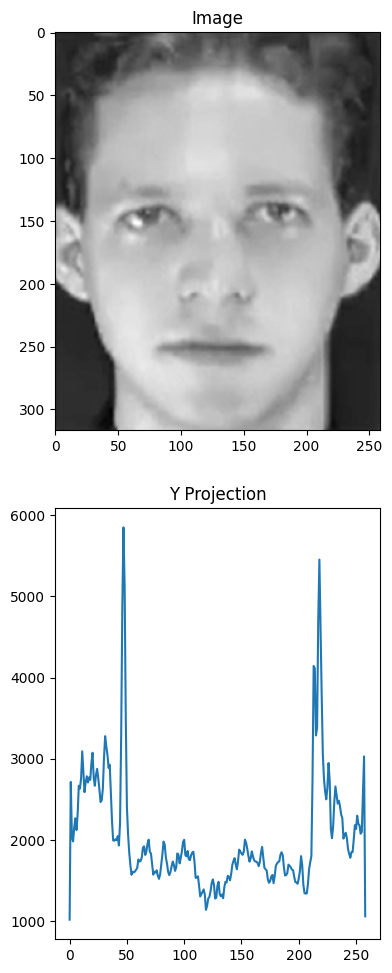

In [6]:
fig = plt.figure(figsize=(4, 10))

plt.subplot(2, 1, 1)
plt.imshow(gray_scale_img, cmap='gray')
plt.title('Image')

plt.subplot(2, 1, 2)
plt.plot(y_projection, )
plt.title('Y Projection')

plt.tight_layout()
plt.show()

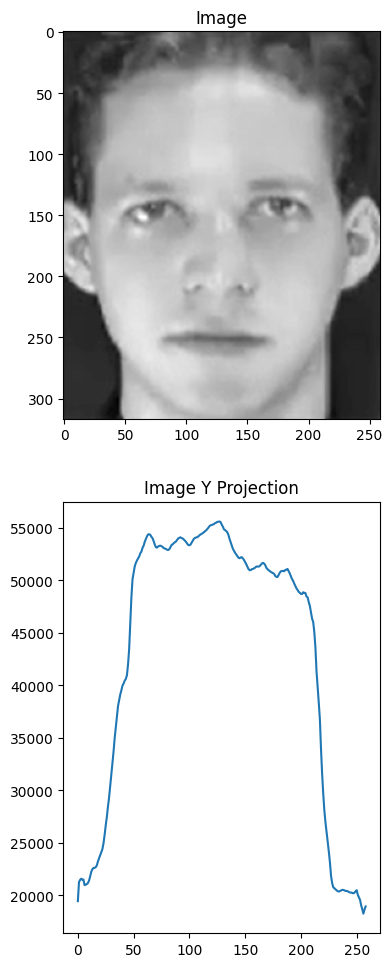

In [7]:
img_y_projection = np.sum(gray_scale_img, axis=0)
fig = plt.figure(figsize=(4, 10))

plt.subplot(2, 1, 1)
plt.imshow(gray_scale_img, cmap='gray')
plt.title('Image')

plt.subplot(2, 1, 2)
plt.plot(img_y_projection, )
plt.title('Image Y Projection')

plt.tight_layout()
plt.show()

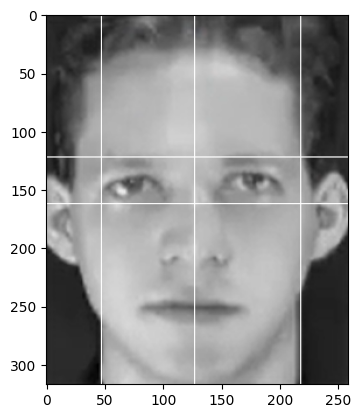

In [8]:
drawing_img = img.copy()
y_projection_copy = y_projection.copy()

left_ear_column_position = np.argmax(y_projection_copy)
drawing_img[:, left_ear_column_position] = 255

y_projection_copy[left_ear_column_position] = 0

right_ear_column_position = np.argmax(y_projection_copy)
drawing_img[:, right_ear_column_position] = 255

nose_column_position = np.argmax(img_y_projection)
drawing_img[:, nose_column_position] = 255

eye_row_position = np.argmax(x_projection)
drawing_img[eye_row_position+20,:] = 255
drawing_img[eye_row_position-20,:] = 255

plt.imshow(drawing_img)

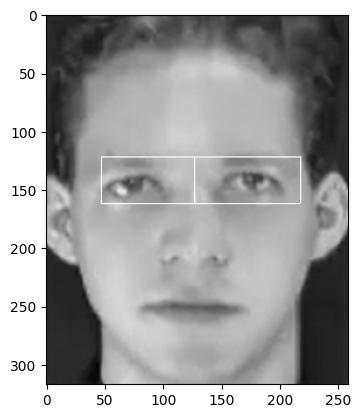

In [9]:
drawing_img = img.copy()

drawing_img[eye_row_position-20:eye_row_position+20, left_ear_column_position] = 255
drawing_img[eye_row_position-20:eye_row_position+20, right_ear_column_position] = 255
drawing_img[eye_row_position-20:eye_row_position+20, nose_column_position] = 255
drawing_img[eye_row_position+20, left_ear_column_position: right_ear_column_position] = 255
drawing_img[eye_row_position-20, left_ear_column_position: right_ear_column_position] = 255

plt.imshow(drawing_img)

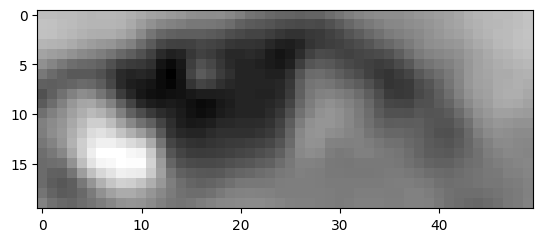

In [10]:
left_eye_template_img = gray_scale_img[
    eye_row_position-5:eye_row_position+15, left_ear_column_position+10: nose_column_position-20
]
plt.imshow(left_eye_template_img, cmap="gray")

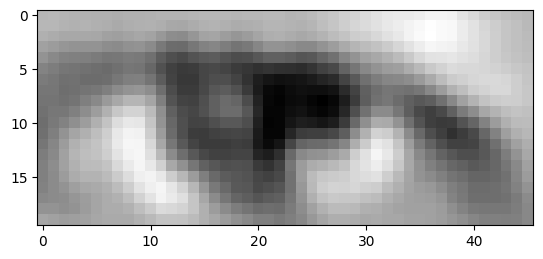

In [11]:
right_eye_template_img = gray_scale_img[
    eye_row_position-10:eye_row_position+10, nose_column_position + 30: right_ear_column_position-15
]
plt.imshow(right_eye_template_img, cmap="gray")

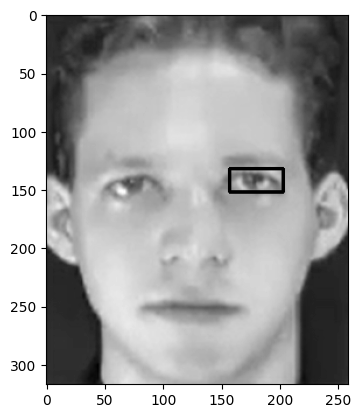

In [22]:
import cv2
import numpy as np

# Load images
img = gray_scale_img.copy()
template = right_eye_template_img

# Perform NCC
result = cv2.matchTemplate(img, template, cv2.TM_CCOEFF_NORMED)

# Find best match
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
top_left = max_loc

# Draw rectangle around match
h, w = template.shape
cv2.rectangle(img, top_left, (top_left[0]+w, top_left[1]+h), (0,255,0), 2)

# Display result
plt.imshow(img,cmap='gray')

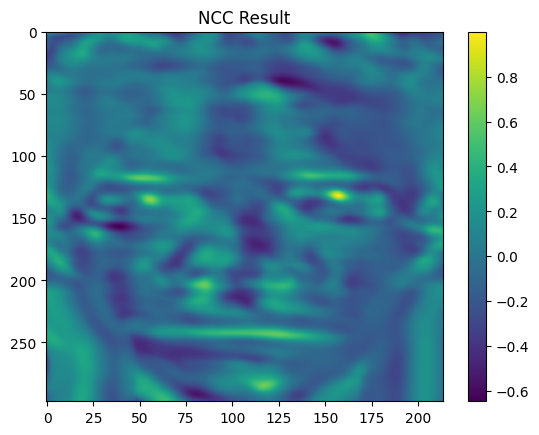

In [13]:
plt.imshow(result, cmap='viridis', aspect='auto')
plt.colorbar()
plt.title("NCC Result")
plt.show()

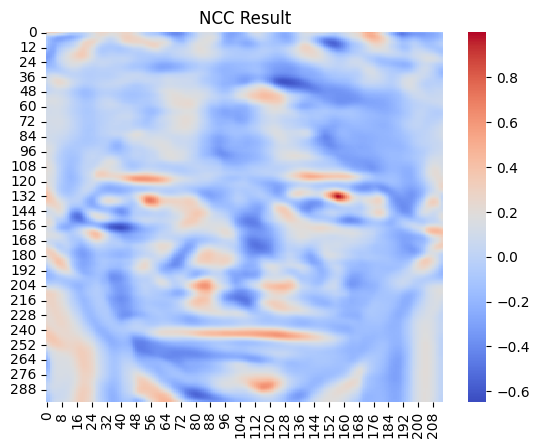

In [14]:
import seaborn as sns

sns.heatmap(result, cmap='coolwarm', annot=False, cbar=True)
plt.title("NCC Result")
plt.show()

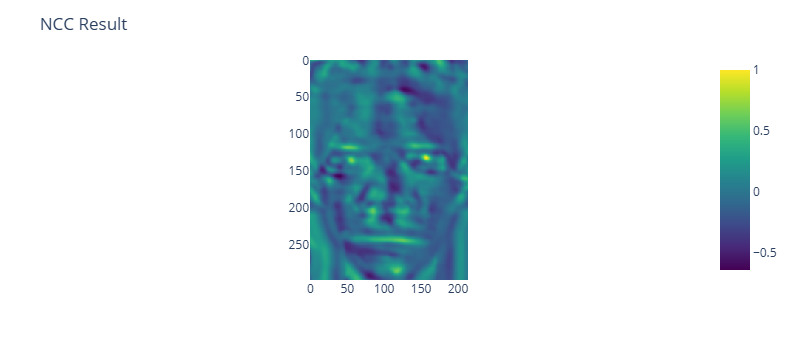

In [15]:
import plotly.express as px

fig = px.imshow(result, color_continuous_scale='Viridis')
fig.update_layout(title="NCC Result")
fig.show()

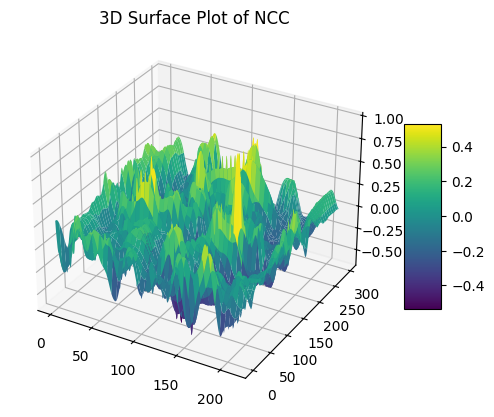

In [16]:
import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Assume `result` is your 2D NCC array
x = np.arange(result.shape[1])
y = np.arange(result.shape[0])
x, y = np.meshgrid(x, y)
z = result

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(x, y, z, cmap='viridis', edgecolor='none')
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title("3D Surface Plot of NCC")
plt.show()


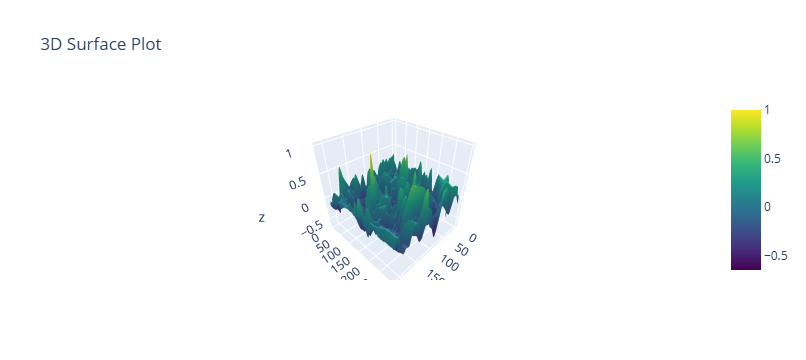

In [17]:
import plotly.graph_objects as go
fig = go.Figure(data=[go.Surface(z=z, colorscale='Viridis')])
fig.update_layout(title="3D Surface Plot")
fig.show()